# Semantic Segmentation Models

Click to open in: \[[GitHub](https://github.com/TissueImageAnalytics/tiatoolbox/blob/develop/examples/06-semantic-segmentation.ipynb)\]\[[Colab](https://colab.research.google.com/github/TissueImageAnalytics/tiatoolbox/blob/develop/examples/06-semantic-segmentation.ipynb)\]



## About this notebook

This jupyter notebook can be run on any computer with a standard browser and no prior installation of any programming language is required. It can run remotely over the Internet, free of charge, thanks to Google Colaboratory. To connect with Colab, click on one of the two blue checkboxes above. Check that "colab" appears in the address bar. You can right-click on "Open in Colab" and select "Open in new tab" if the left click does not work for you. Familiarize yourself with the drop-down menus near the top of the window. You can edit the notebook during the session, for example substituting your own image files for the image files used in this demo. Experiment by changing the parameters of functions. It is not possible for an ordinary user to permanently change this version of the notebook on GitHub or Colab, so you cannot inadvertently mess it up. Use the notebook's File Menu if you wish to save your own (changed) notebook.

To run the notebook on any platform, except for Colab, set up your Python environment, as explained in the
[README](https://github.com/TIA-Lab/tiatoolbox/blob/master/README.md#install-python-package) file.



## About this demo

Semantic segmentation in image processing means partitioning the image into its constructing segments so that each segment corresponds to a specific category of an object present in the image. In other words, semantic segmentation can be considered as classifying each pixel in the image into a pre-defined category. Note that semantic segmentation does not differentiate instances of the same object, like the figure below which shows three examples of road images with their semantic segmentation. You can see how all objects of the same class have the same colour (please refer to [here](https://www.cs.toronto.edu/~tingwuwang/semantic_segmentation.pdf) and [here](https://nanonets.com/blog/semantic-image-segmentation-2020/) to find more information on the semantic segmentation task).

> ![image](https://tiatoolbox.dcs.warwick.ac.uk/notebook/semantic_road.PNG)
> Image courtesy of: Chen, Liang-Chieh, et al. "Deeplab: Semantic image segmentation with deep convolutional nets, atrous convolution, and fully connected crfs." IEEE transactions on pattern analysis and machine intelligence 40.4 (2017): 834-848.

Similar to natural images, semantic segmentation of histology images is the task of identifying the class of each pixel in the image based on the object or tissue type of the region encompassing that pixel.
Semantic segmentation of tissue regions in histology images plays an important role in developing algorithms for cancer diagnosis and prognosis as it can help measure tissue attributes in an objective and reproducible fashion.

> ![image](https://tiatoolbox.dcs.warwick.ac.uk/notebook/semantic_histology.png)
> Example of semantic segmentation in histology images where pixels are classified based on different region types including tumour, fat, inflammatory, necrosis etc.

In this example notebook, we are showing how you can use pretrained models to do automatically segment different tissue region types in a set of input images or WSIs. We first focus on a pretrained model incorporated in the TIAToolbox to achieve semantic annotation of tissue region in histology images of breast cancer. After that, we will explain how you can use your pretrained model in the TIAToolbox model inference pipeline to do prediction on a set WSIs.



## Setting up the environment

### TIAToolbox and dependencies installation

You can skip the following cell if 1) you are not using the Colab plaform or 2) you are using Colab and this is not your first run of the notebook in the current runtime session. If you nevertheless run the cell, you may get an error message, but no harm will be done. On Colab the cell installs `tiatoolbox`, and other prerequisite software. Harmless error messages should be ignored. Outside Colab , the notebook expects `tiatoolbox` to already be installed. (See the instructions in [README](https://github.com/TIA-Lab/tiatoolbox/blob/master/README.md#install-python-package).)



In [ ]:
%%bash
apt-get -y install libopenjp2-7-dev libopenjp2-tools libpixman-1-dev | tail -n 1
pip install uv
uv pip install git+https://github.com/TissueImageAnalytics/tiatoolbox.git@develop | tail -n 1
echo "Installation is done."

> **IMPORTANT**: If you are using Colab and you run the cell above for the first time, please note that you need to restart the session before proceeding through (menu) *"Runtime→Restart session"* . This is needed to load the latest versions of prerequisite packages installed with TIAToolbox. Doing so, you should be able to run all the remaining cells altogether (*"Runtime→Run after"* from the next cell) or one by one.



### Importing related libraries

We import some standard Python modules, and also the Python module `wsireader` (see [details](https://github.com/TIA-Lab/tiatoolbox/blob/master/tiatoolbox/wsicore/wsireader.py)) written by the TIA Centre team.



In [3]:
"""Import modules required to run the Jupyter notebook."""

# Clear logger to use tiatoolbox.logger
import logging
import warnings

if logging.getLogger().hasHandlers():
    logging.getLogger().handlers.clear()

import gc
import sys
from pathlib import Path

import dask.array as da
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import torch
import zarr
from huggingface_hub import hf_hub_download
from matplotlib import cm

from tiatoolbox import logger
from tiatoolbox.models.architecture.unet import UNetModel
from tiatoolbox.models.engine.io_config import IOSegmentorConfig
from tiatoolbox.models.engine.semantic_segmentor import SemanticSegmentor
from tiatoolbox.utils.misc import imread
from tiatoolbox.utils.visualization import overlay_prediction_mask
from tiatoolbox.wsicore.wsireader import WSIReader

if "google.colab" in sys.modules:
    from google.colab import output

    output.enable_custom_widget_manager()
    logger.info("Custom widget manager enabled in Google Colab environment.")

mpl.rcParams["figure.dpi"] = 300  # for high resolution figure in notebook
mpl.rcParams["figure.facecolor"] = "white"  # To make sure text is visible in dark mode
warnings.filterwarnings("ignore")

### GPU or CPU runtime

Processes in this notebook can be accelerated by using a GPU. Therefore, whether you are running this notebook on your system or Colab, you need to check and specify appropriate [device](https://pytorch.org/docs/stable/tensor_attributes.html#torch.device) e.g., "cuda" or "cpu" whether you are using GPU or CPU. In Colab, you need to make sure that the runtime type is set to GPU in the *"Runtime→Change runtime type→Hardware accelerator"*. If you are *not* using GPU, consider changing the `device` flag to `cpu` value, otherwise, some errors will be raised when running the following cells.



In [4]:
device = "cuda"  # Choose appropriate device

### Removing leftovers from previous runs

The cell below removes some redundant directories of they exist—a previous run may have created them. This cell can be skipped if you are running this notebook for the first time.



In [5]:
%%bash
rm -rf tmp
echo "deleting tmp directory"

deleting tmp directory


### Downloading the required files

We download, over the internet, image files used for the purpose of this notebook. In particular, we download a histology tile and a whole slide image of cancerous breast tissue samples to show how semantic segmentation models work. Also, pretrained weights of a Pytorch model and a small WSI are downloaded to illustrate how you can incorporate your own models in the existing TIAToolbox segmentation tool.

> In Colab, if you click the files icon (see below) in the vertical toolbar on the left hand side then you can see all the files which the code in this notebook can access. The data will appear here when it is downloaded.
>
> 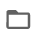



In [6]:
data_dir = "./tmp"
if not Path(data_dir).exists():
    Path(data_dir).mkdir(exist_ok=True)


# Downloading sample image tile
img_file_name = hf_hub_download(
    repo_id="TIACentre/TIAToolBox_Remote_Samples",
    filename="sample_imgs/breast_tissue.jpg",
    repo_type="dataset",
    local_dir=data_dir,
)

# Downloading sample whole-slide image
wsi_file_name = hf_hub_download(
    repo_id="TIACentre/TIAToolBox_Remote_Samples",
    filename="sample_wsis/wsi4_12k_12k.svs",
    repo_type="dataset",
    local_dir=data_dir,
)

# Downloading mini whole-slide image
mini_wsi_file_name = hf_hub_download(
    repo_id="TIACentre/TIAToolBox_Remote_Samples",
    filename="sample_wsis/CMU-1.ndpi",
    repo_type="dataset",
    local_dir=data_dir,
)

# Download external model
model_file_name = hf_hub_download(
    repo_id="TIACentre/TIAToolbox_pretrained_weights",
    filename="fcn-tissue_mask.pth",
    repo_type="model",
    local_dir=data_dir,
)

logger.info("Download is complete.")

|2026-03-10|17:30:02.918| [INFO] HTTP Request: HEAD https://huggingface.co/datasets/TIACentre/TIAToolBox_Remote_Samples/resolve/main/sample_imgs/breast_tissue.jpg "HTTP/1.1 302 Found"
|2026-03-10|17:30:03.074| [INFO] HTTP Request: GET https://huggingface.co/api/datasets/TIACentre/TIAToolBox_Remote_Samples/xet-read-token/ec48eb3d0585d9d8436de7ddc75175508ea3f377 "HTTP/1.1 200 OK"


sample_imgs/breast_tissue.jpg:   0%|          | 0.00/4.89M [00:00<?, ?B/s]

|2026-03-10|17:30:04.227| [INFO] HTTP Request: HEAD https://huggingface.co/datasets/TIACentre/TIAToolBox_Remote_Samples/resolve/main/sample_wsis/wsi4_12k_12k.svs "HTTP/1.1 302 Found"


sample_wsis/wsi4_12k_12k.svs:   0%|          | 0.00/18.8M [00:00<?, ?B/s]

|2026-03-10|17:30:05.630| [INFO] HTTP Request: HEAD https://huggingface.co/datasets/TIACentre/TIAToolBox_Remote_Samples/resolve/main/sample_wsis/CMU-1.ndpi "HTTP/1.1 302 Found"


sample_wsis/CMU-1.ndpi:   0%|          | 0.00/198M [00:00<?, ?B/s]

|2026-03-10|17:30:10.192| [INFO] HTTP Request: HEAD https://huggingface.co/TIACentre/TIAToolbox_pretrained_weights/resolve/main/fcn-tissue_mask.pth "HTTP/1.1 302 Found"
|2026-03-10|17:30:10.314| [INFO] HTTP Request: GET https://huggingface.co/api/models/TIACentre/TIAToolbox_pretrained_weights/xet-read-token/ea909bdcce3aa409bf436c09b4495cca90a8e99b "HTTP/1.1 200 OK"


fcn-tissue_mask.pth:   0%|          | 0.00/135M [00:00<?, ?B/s]

|2026-03-10|17:30:16.712| [INFO] Download is complete.


## Semantic segmentation using TIAToolbox pretrained models

In this section, we will investigate the use of semantic segmentation models that have been already trained on a specific task and incorporated in the TIAToolbox.
Particularly, the model we demonstrate can estimate the probability of each pixel in an image (tile or whole slide images) of breast cancer sample belonging to one of the following classes:

- Tumour
- Stroma
- Inflammatory
- Necrosis
- Others (nerves, vessels, blood cells, adipose, etc.)

> More information on the model and the dataset used for training can be found [here](https://academic.oup.com/bioinformatics/article/35/18/3461/5307750) (_Amgad et al., "Structured crowdsourcing enables convolutional segmentation of histology image"_) and the data is available for download using this [link](https://github.com/PathologyDataScience/BCSS).

### Inference on tiles

Much similar to the patch classifier functionality of the tiatoolbox, the semantic segmentation module works both on image tiles and structured WSIs. First, we need to create an instance of the `SemanticSegmentor` class which controls the whole process of semantic segmentation task and then use it to do prediction on the input image(s):



In [7]:
# Tile prediction
bcc_segmentor = SemanticSegmentor(
    model="fcn_resnet50_unet-bcss",
    num_workers=4,
    batch_size=4,
)

output = bcc_segmentor.run(
    images=[img_file_name],
    input_resolutions=[{"units": "baseline", "resolution": 1.0}],
    patch_input_shape=(1024, 1024),
    patch_output_shape=(512, 512),
    stride_shape=(512, 512),
    patch_mode=False,
    auto_get_mask=False,
    device=device,
    save_dir="./tmp/sample_tile_results/",
    return_probabilities=True,
)

|2026-03-10|17:30:17.552| [INFO] HTTP Request: HEAD https://huggingface.co/TIACentre/TIAToolbox_pretrained_weights/resolve/main/fcn_resnet50_unet-bcss.pth "HTTP/1.1 302 Found"


|2026-03-10|17:30:17.783| [WARNING] GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.


|2026-03-10|17:30:17.785| [INFO] output_type has been updated to 'zarr' for saving the file to ./tmp/sample_tile_results/.Remove `save_dir` input to return the output as a `dict`.
|2026-03-10|17:30:18.244| [INFO] When providing multiple whole slide images, the outputs will be saved and the locations of outputs will be returned to the calling function when `run()` finishes successfully.


Processing WSIs:   0%|          | 0/1 [00:00<?, ?it/s]

|2026-03-10|17:30:18.913| [WARNING] Raw data is None.
|2026-03-10|17:30:18.914| [WARNING] Unknown scale (no objective_power or mpp)


Inferring patches:   0%|          | 0/16 [00:00<?, ?it/s]

|2026-03-10|17:30:19.692| [WARNING] Raw data is None.
|2026-03-10|17:30:19.695| [WARNING] Unknown scale (no objective_power or mpp)
|2026-03-10|17:30:19.706| [WARNING] Raw data is None.
|2026-03-10|17:30:19.707| [WARNING] Raw data is None.
|2026-03-10|17:30:19.711| [WARNING] Unknown scale (no objective_power or mpp)
|2026-03-10|17:30:19.713| [WARNING] Unknown scale (no objective_power or mpp)
|2026-03-10|17:30:19.733| [WARNING] Raw data is None.
|2026-03-10|17:30:19.739| [WARNING] Unknown scale (no objective_power or mpp)
|2026-03-10|17:30:19.699| [WARNING] Raw data is None.
|2026-03-10|17:30:19.752| [WARNING] Unknown scale (no objective_power or mpp)


Merging rows:   0%|          | 0/8 [00:00<?, ?it/s]

Saving output to tmp/sample_tile_results/breast_tissue.zarr.:   0%|          | 0/81 [00:00<?, ?it/s]

|2026-03-10|17:30:27.230| [INFO] Output file saved at tmp/sample_tile_results/breast_tissue.zarr.


There we go! With only two lines of code, thousands of WSIs can be processed automatically.
There are many parameters associated with `SemanticSegmentor`. We explain these as we meet them, while proceeding through the notebook. Here we explain only the ones mentioned above:

- `model`: specifies the name of the pretrained model included in the TIAToolbox (case-sensitive). We are expanding our library of models pretrained on various segmentation tasks. You can find a complete list of available pretrained models [here](https://tia-toolbox.readthedocs.io/en/latest/pretrained.html). In this example, we use the `"fcn_resnet50_unet-bcss"` pretrained model, which is a fully convolutional network that follows [UNet](https://arxiv.org/abs/1505.04597) network architecture and benefits from a [ResNet50](https://arxiv.org/abs/1512.03385) model as its encoder part.

- `num_workers`: as the name suggests, this parameter controls the number of CPU cores (workers) that are responsible for the "loading of network input" process, which consists of patch extraction, preprocessing, and post-processing etc.

- `batch_size`: controls the batch size, or the number of input instances to the network in each iteration. If you use a GPU, be careful not to set the `batch_size` larger than the GPU memory limit would allow.

After the `bcc_segmentor` has been instantiated as a semantic segmentation engine with our desired pretrained model, one can call the `run` method to do inference on a list of input images (or WSIs). The `run` function automatically processes all the images on the input list and saves the results on the disk. The process usually comprises patch extraction (because the whole tile or WSI won't fit into limited GPU memory), preprocessing, model inference, post-processing and prediction assembly. There some important parameters that should be set to use the `run` method properly:

- `images`: List of inputs to be processed. Note that items in the list should be paths to the inputs stored on the disk.

- `input_resolutions`: List of dictionaries with keys 'units' and 'resolution', specifying the resolution at which the input is processed. Because plain images only have a baseline layer, the options in this case should always be the defaults `units="baseline"` and `resolution=1.0` and, as defaults, can be omitted.

- `patch_input_shape`: the shape of the patches extracted from the input image (WSI) to be fed into the model. The bigger the patch size the more GPU memory is needed.

- `patch_output_shape`: The expected shape of output prediction maps for patches. This should be set based on the knowledge we have from the model design. For example, we know that the shape of output maps from `"fcn_resnet50_unet-bcss"` model is half of the input shape in each dimension. Therefore, as we set the `patch_input_shape=[1024, 1024]`), we need to set the `patch_output_shape=[512, 512]`.

- `stride_shape`: Stride of output patches during tile and WSI processing. This parameter is used to set the amount of overlap between neighbouring prediction patches. Based on this parameter, the toolbox automatically calculates the patch extraction stride.

- `patch_mode`: Whether input is treated as patches (`True`) or WSIs (`False`). In this example, we process a tile image by dividing it into patches, so `patch_mode` is set to `False`.

- `auto_get_mask`: Whether to automatically generate segmentation masks using `wsireader.tissue_mask()` during processing.

- `device`: specify appropriate [device](https://pytorch.org/docs/stable/tensor_attributes.html#torch.device) e.g., "cuda", "cuda:0", "mps", "cpu" etc.

- `save_dir`: Path to the main folder in which prediction results for each input will be stored separately.

- `return_probabilities`: Whether to return per-class probabilities.

We should mention that when you are using TIAToolbox pretrained models, you don't need to worry about setting the input/output shape parameters as their optimal values will be loaded by default.

In the `output`, a list of the paths to its input files and the processed outputs saved on the disk is returned. This can be used for loading the results for processing and visualisation.



|2026-03-10|17:30:27.312| [INFO] Prediction method output is: {PosixPath('tmp/sample_imgs/breast_tissue.jpg'): PosixPath('tmp/sample_tile_results/breast_tissue.zarr')}
|2026-03-10|17:30:27.315| [INFO] Key of the ouput is tmp/sample_imgs/breast_tissue.jpg. Value of the output is tmp/sample_tile_results/breast_tissue.zarr
|2026-03-10|17:30:27.836| [INFO] Input image dimensions: (4000, 4000, 3)
|2026-03-10|17:30:27.891| [INFO] Raw prediction dimensions: (4000, 4000)
|2026-03-10|17:30:27.912| [INFO] Processed probabilities dimensions: (4000, 4000, 5)


Text(0.5, 0.82, 'Processed prediction map')

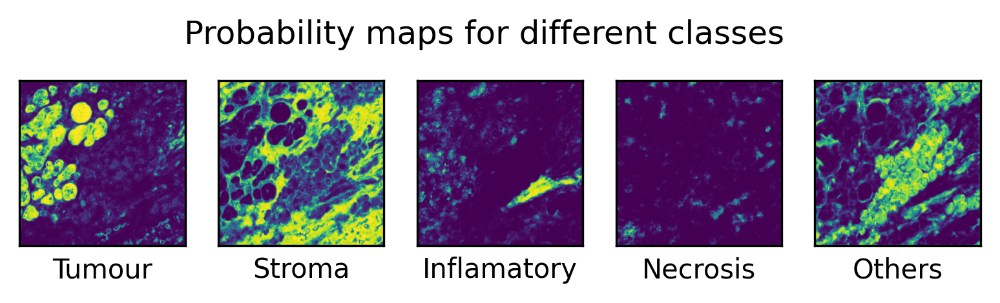

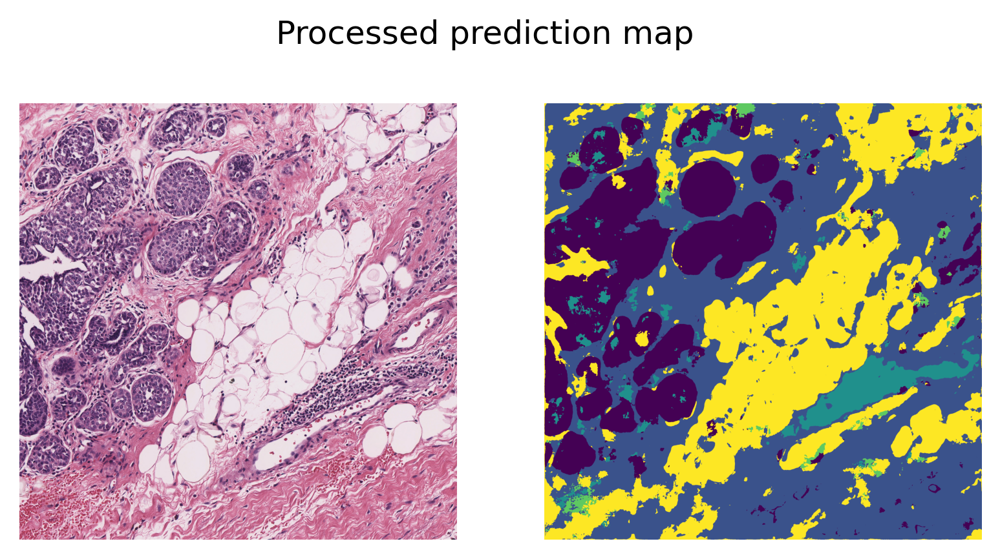

In [ ]:
logger.info("Prediction method output is: %s", output)
logger.info(
    "Key of the ouput is %s. Value of the output is %s",
    Path(img_file_name),
    output[Path(img_file_name)],
)

tile = imread(img_file_name)
logger.info(
    "Input image dimensions: (%d, %d, %d)",
    tile.shape[0],
    tile.shape[1],
    tile.shape[2],
)

zarr_prediction_raw = zarr.open(output[Path(img_file_name)], mode="r")

# Simple processing of the raw prediction to generate semantic segmentation task
tile_prediction = da.from_zarr(zarr_prediction_raw["predictions"])
logger.info(
    "Raw prediction dimensions: (%d, %d)",
    tile_prediction.shape[0],
    tile_prediction.shape[1],
)

# Get probabilities of each class
tile_probabilities_per_class = da.from_zarr(zarr_prediction_raw["probabilities"])
logger.info(
    "Processed probabilities dimensions: (%d, %d, %d)",
    tile_probabilities_per_class.shape[0],
    tile_probabilities_per_class.shape[1],
    tile_probabilities_per_class.shape[2],
)

# showing the predicted semantic segmentation
fig = plt.figure()
label_names_dict = {
    0: "Tumour",
    1: "Stroma",
    2: "Inflamatory",
    3: "Necrosis",
    4: "Others",
}
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    (
        plt.imshow(tile_probabilities_per_class[:, :, i]),
        plt.xlabel(
            label_names_dict[i],
        ),
        ax.axes.xaxis.set_ticks([]),
        ax.axes.yaxis.set_ticks([]),
    )
fig.suptitle("Probability maps for different classes", y=0.65)

# showing processed results
fig2 = plt.figure()
ax1 = plt.subplot(1, 2, 1), plt.imshow(tile), plt.axis("off")
ax2 = plt.subplot(1, 2, 2), plt.imshow(tile_prediction), plt.axis("off")
fig2.suptitle("Processed prediction map", y=0.82)

# Clean up variables to free up memory
del (
    tile,
    tile_prediction,
    tile_probabilities_per_class,
    zarr_prediction_raw,
    output,
    bcc_segmentor,
)
gc.collect()

As printed above, when using the key `predictions` from the result dictionary, we obtain a single-channel prediction map, where each pixel value indicates the class label to which that pixel is assigned. A simple post-processing step is applied to remove the extra padded borders, ensuring that the prediction map matches the original input image size.

Alternatively, when using the key `probabilities`, the output is a five-channel probability map, where each channel corresponds to one tissue category. In this case, each pixel contains a probability value representing the likelihood of that pixel belonging to the corresponding tissue type. This multi-channel output provides a more detailed and interpretable representation of the model’s confidence across different tissue classes.

### Inference on WSIs

The next step is to use the TIAToolbox's embedded model for region segmentation in a whole slide image. The process is quite similar to what we have done for tiles. Here we just introduce a some important parameters that should be considered when configuring the segmentor for WSI inference.



In [ ]:
bcc_segmentor = SemanticSegmentor(
    model="fcn_resnet50_unet-bcss",
    num_workers=4,
    batch_size=4,
)

bcc_wsi_ioconfig = IOSegmentorConfig(
    input_resolutions=[{"units": "mpp", "resolution": 0.25}],
    output_resolutions=[{"units": "mpp", "resolution": 0.25}],
    patch_input_shape=(1024, 1024),
    patch_output_shape=(512, 512),
    stride_shape=(512, 512),
)

|2026-03-10|17:30:57.475| [INFO] HTTP Request: HEAD https://huggingface.co/TIACentre/TIAToolbox_pretrained_weights/resolve/main/fcn_resnet50_unet-bcss.pth "HTTP/1.1 302 Found"


|2026-03-10|17:30:57.686| [WARNING] GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.


When doing inference on WSIs, it is important to set the data stream configurations (such as input resolution, output resolution, size of merged predictions, etc.) appropriately for each model and application. In TIAToolbox, `IOSegmentorConfig` class is used to set these configurations as we have done in the above cell.
Parameters of `IOSegmentorConfig` have self-explanatory names, but let's have look at their definition:

- `input_resolutions`: a list specifying the resolution of each input head of model in the form of a dictionary. List elements must be in the same order as target `model.forward()`. Of course, if your model accepts only one input, you just need to put one dictionary specifying `'units'` and `'resolution'`. But it's good to know that TIAToolbox supports a model with more than one input!
- `output_resolutions`: a list specifying the resolution of each output head from model in the form of a dictionary. List elements must be in the same order as target `model.infer_batch()`.
- `patch_input_shape`: Shape of the largest input in (height, width) format.
- `patch_output_shape`: Shape of the largest output in (height, width) format.
- `stride_shape`: Stride in (y, x) direction for patch extraction.



In [ ]:
# WSI prediction
wsi_output = bcc_segmentor.run(
    images=[wsi_file_name],
    masks=None,
    ioconfig=bcc_wsi_ioconfig,
    patch_mode=False,
    save_dir="./tmp/sample_wsi_results/",
    device=device,
    return_probabilities=False,
)

|2026-03-10|17:30:57.795| [INFO] output_type has been updated to 'zarr' for saving the file to ./tmp/sample_wsi_results/.Remove `save_dir` input to return the output as a `dict`.
|2026-03-10|17:30:58.336| [INFO] When providing multiple whole slide images, the outputs will be saved and the locations of outputs will be returned to the calling function when `run()` finishes successfully.


Processing WSIs:   0%|          | 0/1 [00:00<?, ?it/s]

|2026-03-10|17:30:59.647| [WARNING] Read: Scale > 1.This means that the desired resolution is higher than the WSI baseline (maximum encoded resolution). Interpolation of read regions may occur.


Inferring patches:   0%|          | 0/144 [00:00<?, ?it/s]

Merging rows:   0%|          | 0/24 [00:00<?, ?it/s]

Saving output to tmp/sample_wsi_results/wsi4_12k_12k.zarr.:   0%|          | 0/438 [00:00<?, ?it/s]

|2026-03-10|17:31:54.760| [INFO] Output file saved at tmp/sample_wsi_results/wsi4_12k_12k.zarr.


Note the only differences made here are:

1. `masks=None` in the `run` function: `masks` argument similar to the `images` should be a list of paths to the desired image masks. Patches from `images` are only processed if they are within a masked area of their corresponding `masks`. If not provided (`masks=None`), then a tissue mask will be automatically generated for whole-slide images or the entire image is processed for image tiles.

The above cell might take a while to process, especially if you have set `device="cpu"`. The processing time depends on the size of the input WSI and the selected resolution. Here, we have not specified any values, which means that the `baseline` resolution of the WSI, which is $40\times$ in this example, will be used.



|2026-03-10|17:31:55.012| [INFO] Prediction method output is: {PosixPath('tmp/sample_wsis/wsi4_12k_12k.svs'): PosixPath('tmp/sample_wsi_results/wsi4_12k_12k.zarr')}
|2026-03-10|17:31:55.014| [INFO] Key of the ouput is tmp/sample_wsis/wsi4_12k_12k.svs. Value of the output is tmp/sample_wsi_results/wsi4_12k_12k.zarr


|2026-03-10|17:31:56.744| [INFO] WSI original dimensions: (12000, 12000)
|2026-03-10|17:31:56.802| [INFO] Raw prediction dimensions: (12024, 12024)
|2026-03-10|17:31:58.174| [INFO] WSI overview dimensions: (1503, 1503)


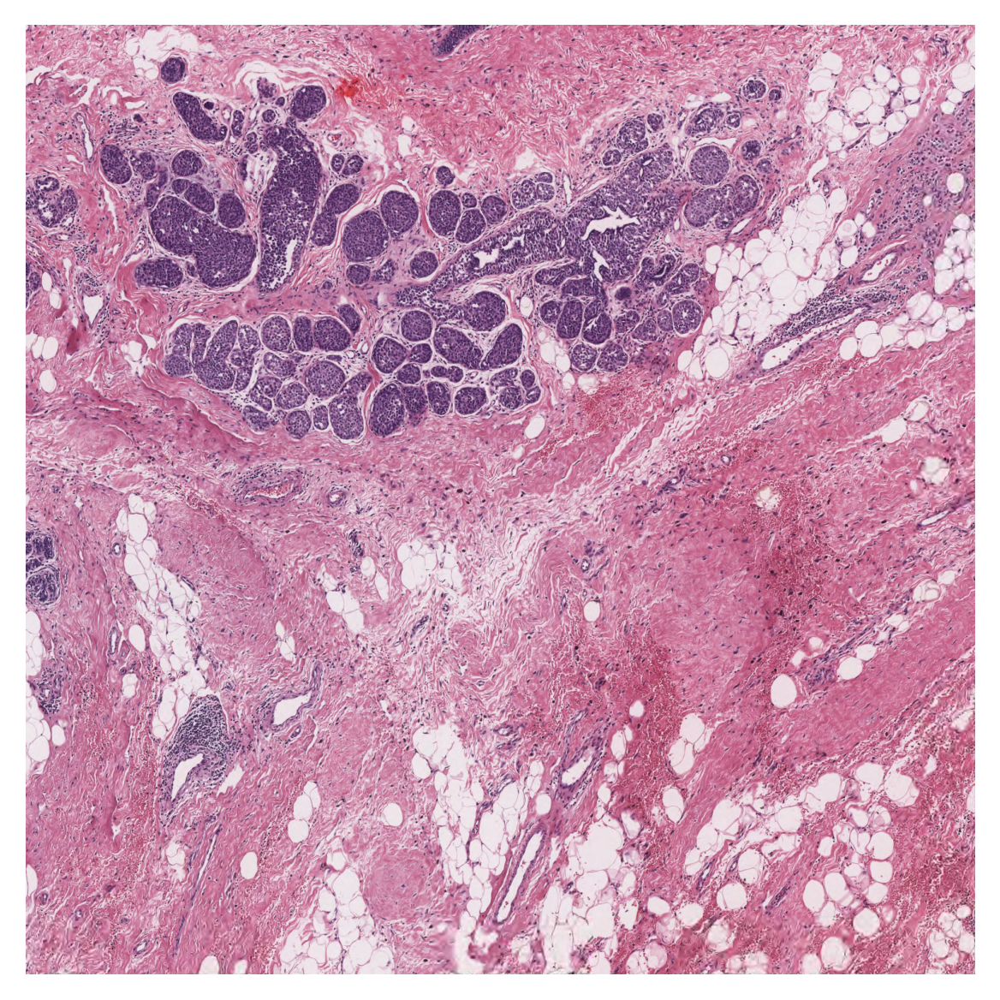

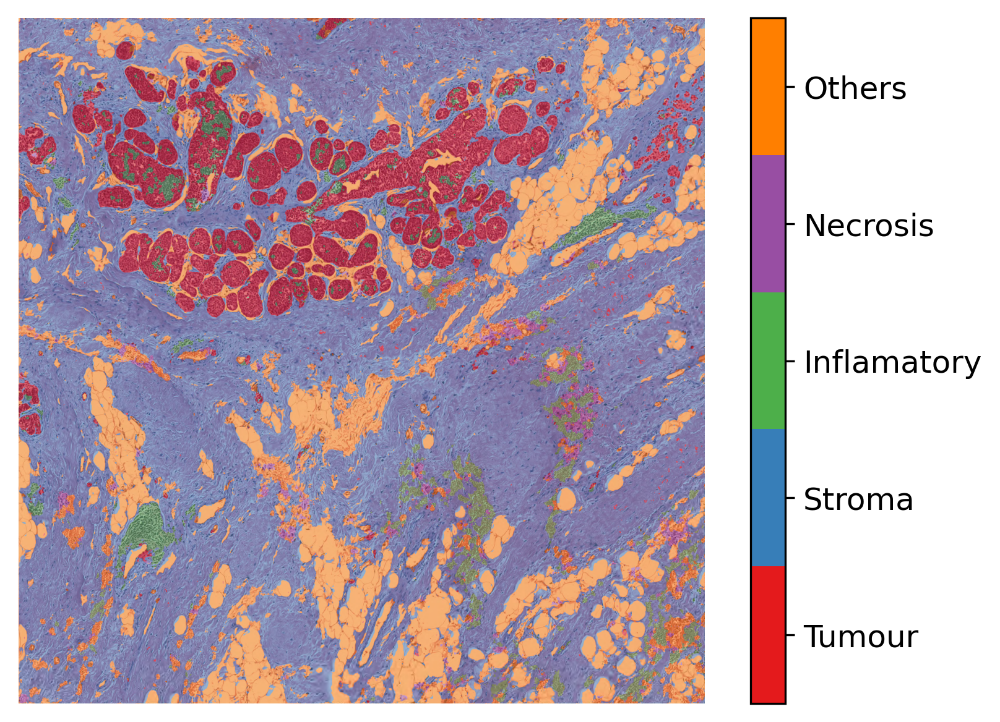

In [ ]:
logger.info("Prediction method output is: %s", wsi_output)
logger.info(
    "Key of the ouput is %s. Value of the output is %s",
    Path(wsi_file_name),
    wsi_output[Path(wsi_file_name)],
)

wsi = WSIReader.open(wsi_file_name)
logger.info(
    "WSI original dimensions: (%d, %d)",
    wsi.info.slide_dimensions[0],
    wsi.info.slide_dimensions[1],
)

zarr_prediction_raw = zarr.open(wsi_output[Path(wsi_file_name)], mode="r")
# Simple processing of the raw prediction to generate semantic segmentation task
wsi_prediction = da.from_zarr(zarr_prediction_raw["predictions"])
logger.info(
    "Raw prediction dimensions: (%d, %d)",
    wsi_prediction.shape[0],
    wsi_prediction.shape[1],
)


# [WSI overview extraction]
# Now reading the WSI to extract it's overview
# extracting slide overview using `slide_thumbnail` method
overview_info = {"units": "mpp", "resolution": 8.0}
wsi_overview = wsi.slide_thumbnail(
    resolution=overview_info["resolution"],
    units=overview_info["units"],
)
logger.info(
    "WSI overview dimensions: (%d, %d)",
    wsi_overview.shape[0],
    wsi_overview.shape[1],
)
# produce overview of wsi semantic segmentation prediction
overview_resolution = overview_info["resolution"]
# Adjust the resolution of the predictions
prediction_resolution = bcc_wsi_ioconfig.output_resolutions[0]["resolution"]
scale_factor = (
    overview_resolution / prediction_resolution
)  # the scale factor between prediction and overview
wsi_prediction_overview = wsi_prediction[::scale_factor, ::scale_factor]

plt.figure(), plt.imshow(wsi_overview)
plt.axis("off")

# [Overlay map creation]
# creating label-color dictionary to be fed into `overlay_prediction_mask` function
# to help generating color legend
label_dict = {"Tumour": 0, "Stroma": 1, "Inflamatory": 2, "Necrosis": 3, "Others": 4}
label_color_dict = {}
colors = cm.get_cmap("Set1").colors
for class_name, label in label_dict.items():
    label_color_dict[label] = (class_name, 255 * np.array(colors[label]))
# Creat overlay map using the `overlay_prediction_mask` helper function
overlay_prediction_mask(
    wsi_overview,
    np.array(wsi_prediction_overview),
    alpha=0.5,
    label_info=label_color_dict,
    return_ax=True,
)

del (
    zarr_prediction_raw,
    wsi_prediction,
    wsi_overview,
    wsi_prediction_overview,
    wsi_output,
)
gc.collect()  # free up memory

As you can see above, we first post-process the prediction map, the same way as we did for tiles, to create the semantic segmentation map. Then, in order to visualise the segmentation prediction on the tissue image, we read the processed WSI and extract its overview. We adjusted the resolution of prediction to match the WSI resolution. Finally, we used the `overlay_prediction_mask` helper function of the TIAToolbox to overlay the prediction map on the overview image and depict it with a colour legend.

In summary, it is very easy to use pretrained models in the TIAToolbox to do predefined tasks. In fact, you don't even need to set any parameters related to a model’s input/output when you decide to work with one of TIAToolbox’s pretrained models (they will be set automatically, based on their optimal values). Here we explain how the parameters work, so we need to show them explicitly. In other words, region segmentation in images can be done as easily as:

```
segmentor = SemanticSegmentor(model="fcn_resnet50_unet-bcss", num_workers=4, batch_size=4)

output = segmentor.run(images=[img_file_name], input_resolutions=[{"units": "baseline", "resolution": 1.0}], patch_mode=False, auto_get_mask=False, save_dir="./tmp/sample_tile_results/")
```

In addition to the parameters shown in the previous examples, several other parameters can also be set for `run` method, as listed below.

- `overwrite`: Whether to overwrite existing output files. Default is `False`.

- `output_type`: Desired output format: "dict", "zarr", or "annotationstore". Default is `"dict"`.

- `class_dict`: Mapping of classification outputs to class names.

- `labels`: Optional labels for input images. Only a single label per image is supported.

- `memory_threshold`: Memory usage threshold (percentage) to trigger caching behavior. This is recommended when processing large files. Try reducing the threshold if you get OOM errors consistently.

- `output_file`: Filename for saving output (e.g., ".zarr" or ".db").

- `return_labels`: Whether to return labels with predictions.

- `scale_factor`: Scale factor for annotations (model_mpp / slide_mpp). Used to convert coordinates to baseline resolution.

- `verbose`: Whether to enable verbose logging.

Having said that, you may need to take care of a couple of other things if you want to use the same model with new weights, or even use a whole new model in the TIAToolbox inference pipeline. But don't worry, these will be covered in the next section of this notebook.



## Semantic segmentation using user-trained (external) models

At the TIACentre we are extending the number of pretrained models in the toolbox as fast as we can, to cover more tasks and tissue types. Nevertheless, users may need to use their own models in the TIAToolbox inference pipeline. In this case, TIAToolbox removes the burden of programing WSI processing, patch extraction, prediction aggregation, and multi-processing handling. Projects at scale provide further complications. But TIAToolbox comes to the rescue!
TIAToolbox supports **PyTorch** models. It's very easy to fit torch models in theTIAToolbox inference pipeline. We show you how.

### Tissue segmentation model as an external model

We have a model that has been trained for tissue mask segmentation i.e., a PyTorch model that has been trained to distinguish between tissue and background, and we want to use it for tissue mask generation (instead of using a simple thresholding technique like Otsu's method).

The first thing to do is to prepare our model. As an illustration of the technique, we use a generic UNet architecture that already been implemented in the TIAToolbox. The section "Downloading the required files" above describes downloading the weights pretrained for segmentation, and these are loaded into the model.



In [12]:
# define model architecture
external_model = UNetModel(
    num_input_channels=3,  # number of input image channels (3 for RGB)
    # number of model's output channels. 2 for two classes foreground and background.
    num_output_channels=2,
    # model used in the encoder part of the model to extract features
    encoder="resnet50",
    decoder_block=[
        3,
    ],  #  A list of convolution layers (each item specifies the kernel size)
)

# Loading pretrained weights into the model
map_location = torch.device(device)
pretrained_weights = torch.load(model_file_name, map_location=torch.device(device))
external_model.load_state_dict(pretrained_weights)

<All keys matched successfully>

This is just an example, and you can use any CNN model of your choice. Remember that, in order to use `SemanticSegmentor`, `model` weights should already be loaded.

Now that we have our model in place, let's create our `SemanticSegmentor`. Also, we need to configure the Input/Output stream of data for our model using `IOSegmentorConfig`.



In [ ]:
tissue_segmentor = SemanticSegmentor(
    model=external_model,
    num_workers=4,
    batch_size=4,
)

# define the I/O configurations for tissue segmentation model
tissue_segmentor_ioconfig = IOSegmentorConfig(
    input_resolutions=[{"units": "mpp", "resolution": 2.0}],
    output_resolutions=[{"units": "mpp", "resolution": 2.0}],
    patch_input_shape=(1024, 1024),
    patch_output_shape=(512, 512),
    stride_shape=(512, 512),
)

|2026-03-10|17:32:03.105| [WARNING] GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.


Now, everything is in place to start the prediction using the defined `tissue_segmentor` on how many input images we like:



In [ ]:
tissue_mask_output = tissue_segmentor.run(
    [mini_wsi_file_name],
    patch_mode=False,
    device=device,
    ioconfig=tissue_segmentor_ioconfig,
    save_dir="./tmp/tissue_mask_results/",
    return_probabilities=False,
)
del tissue_segmentor
gc.collect()

|2026-03-10|17:32:03.136| [INFO] output_type has been updated to 'zarr' for saving the file to ./tmp/tissue_mask_results/.Remove `save_dir` input to return the output as a `dict`.
|2026-03-10|17:32:03.536| [INFO] When providing multiple whole slide images, the outputs will be saved and the locations of outputs will be returned to the calling function when `run()` finishes successfully.


Processing WSIs:   0%|          | 0/1 [00:00<?, ?it/s]

Inferring patches:   0%|          | 0/81 [00:00<?, ?it/s]

Merging rows:   0%|          | 0/17 [00:00<?, ?it/s]

Saving output to tmp/tissue_mask_results/CMU-1.zarr.:   0%|          | 0/268 [00:00<?, ?it/s]

|2026-03-10|17:33:32.274| [INFO] Output file saved at tmp/tissue_mask_results/CMU-1.zarr.


If everything has gone well, `tissue_segmentor` should have been able to use our external model to do prediction on a whole slide image. Let's see how well our model worked:



|2026-03-10|17:33:32.310| [INFO] Prediction method output is: {PosixPath('tmp/sample_wsis/CMU-1.ndpi'): PosixPath('tmp/tissue_mask_results/CMU-1.zarr')}
|2026-03-10|17:33:32.312| [INFO] Key of the ouput is tmp/sample_wsis/CMU-1.ndpi. Value of the output is tmp/tissue_mask_results/CMU-1.zarr
|2026-03-10|17:33:32.379| [INFO] WSI original dimensions: (38144, 51200)
|2026-03-10|17:35:25.896| [INFO] WSI input dimensions: (8679, 11684)
|2026-03-10|17:35:25.927| [INFO] Raw prediction dimensions: (8679, 11684)
|2026-03-10|17:35:52.473| [INFO] WSI overview dimensions: (2170, 2921)


(np.float64(-0.5), np.float64(11683.5), np.float64(8678.5), np.float64(-0.5))

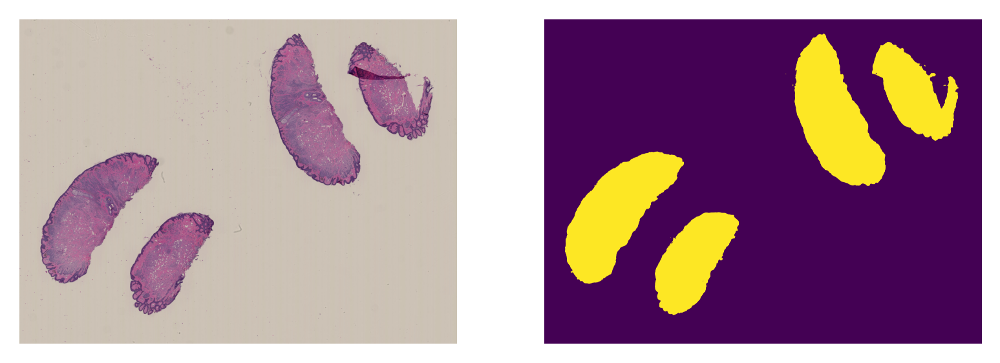

In [ ]:
logger.info("Prediction method output is: %s", tissue_mask_output)
logger.info(
    "Key of the ouput is %s. Value of the output is %s",
    Path(mini_wsi_file_name),
    tissue_mask_output[Path(mini_wsi_file_name)],
)

# [WSI overview extraction]
# Now reading the WSI
mini_wsi = WSIReader.open(mini_wsi_file_name)
logger.info(
    "WSI original dimensions: (%d, %d)",
    mini_wsi.info.slide_dimensions[1],
    mini_wsi.info.slide_dimensions[0],
)

# extracting slide overview using `slide_thumbnail` method
wsi_shape = mini_wsi.slide_dimensions(
    resolution=tissue_segmentor_ioconfig.input_resolutions[0]["resolution"],
    units=tissue_segmentor_ioconfig.input_resolutions[0]["units"],
)
logger.info(
    "WSI input dimensions: (%d, %d)",
    wsi_shape[1],
    wsi_shape[0],
)

# Loading the raw prediction
zarr_prediction_raw = zarr.open(tissue_mask_output[Path(mini_wsi_file_name)], mode="r")
mini_wsi_prediction = da.from_zarr(
    zarr_prediction_raw["predictions"],
    chunks=(500, 500),
)
logger.info(
    "Raw prediction dimensions: (%d, %d)",
    mini_wsi_prediction.shape[0],
    mini_wsi_prediction.shape[1],
)

# to create the wsi overview at a specific resolution
overview_info = {"units": "mpp", "resolution": 8.0}
# extracting slide overview using `slide_thumbnail` method
mini_wsi_overview = mini_wsi.slide_thumbnail(
    resolution=overview_info["resolution"],
    units=overview_info["units"],
)
logger.info(
    "WSI overview dimensions: (%d, %d)",
    mini_wsi_overview.shape[0],
    mini_wsi_overview.shape[1],
)

# Adjust the resolution of the predictions
overview_resolution = overview_info["resolution"]

prediction_resolution = tissue_segmentor_ioconfig.output_resolutions[0]["resolution"]
scale_factor = int(
    overview_resolution / prediction_resolution
)  # the scale factor between prediction and overview resolution


mini_wsi_prediction_overview = mini_wsi_prediction[::scale_factor, ::scale_factor]

ax = plt.subplot(1, 2, 1), plt.imshow(mini_wsi_overview)
plt.axis("off")
ax = plt.subplot(1, 2, 2), plt.imshow(mini_wsi_prediction)
plt.axis("off")

del (
    zarr_prediction_raw,
    mini_wsi_prediction,
    mini_wsi_overview,
    mini_wsi_prediction_overview,
    tissue_mask_output,
)
gc.collect()  # free up memory

And that's it!

To once again see how easy it is to use an external model in TIAToolbox's semantic segmentation class, we summarize in pseudo-code, as below:

```
# 1- Define the Pytorch model and load weights
model = get_CNN()
model.load_state_dict(pretrained_weights)

# 2- Define the segmentor and IOconfig
segmentor = SemanticSegmentor(model)
ioconfig = IOSegmentorConfig(...)

# 3- Run the prediction
output = tissue_segmentor.run([img_paths], save_dir, ioconfig, ...)

```



Feel free to play around with the parameters, models, and experimenting with new images (just remember to run the first cell of this notebook again, so the created folders for the current examples would be removed or alternatively change the `save_dir` parameters in new calls of `predict` function). Currently, we are extending our collection of pre-trained models. To keep a track of them, make sure to follow our releases. You can also check [here](https://tia-toolbox.readthedocs.io/en/latest/usage.html?highlight=architecture#module-tiatoolbox.models.architecture). Furthermore, if you want to use your own pretrained model for semantic segmentation (or any other pixel-wise prediction models) in the TIAToolbox framework, you can follow the instructions in our example notebook on [advanced model techniques](https://github.com/TissueImageAnalytics/tiatoolbox/blob/develop/examples/07-advanced-modeling.ipynb) to gain some insights and guidance.
We welcome any trained model in computational pathology (in any task) for addition to TIAToolbox. If you have such a model (in Pytorch) and want to contribute, please contact us or simply create a PR on our GitHub page.



## How to visualize in TIAViz

TIAToolbox provides a flexible visualization tool for viewing slides and overlaying associated model outputs or annotations. It is a browser-based UI built using TIAToolbox and Bokeh. Below we show how to use this tool for our prediction example.

Note that if you are running this notebook on Colab this step might not be for you.



In [ ]:
wsi_output = bcc_segmentor.run(
    images=[wsi_file_name],
    masks=None,
    ioconfig=bcc_wsi_ioconfig,
    patch_mode=False,
    save_dir="./tmp/sample_wsi_results/",
    device=device,
    return_probabilities=False,
    output_type="annotationstore",
    overwrite=True,
    class_dict={0: "Tumour", 1: "Stroma", 2: "Inflamatory", 3: "Necrosis", 4: "Others"},
)

|2026-03-10|17:36:09.959| [INFO] When providing multiple whole slide images, the outputs will be saved and the locations of outputs will be returned to the calling function when `run()` finishes successfully.


Processing WSIs:   0%|          | 0/1 [00:00<?, ?it/s]

|2026-03-10|17:36:11.280| [WARNING] Read: Scale > 1.This means that the desired resolution is higher than the WSI baseline (maximum encoded resolution). Interpolation of read regions may occur.


Inferring patches:   0%|          | 0/144 [00:00<?, ?it/s]

Merging rows:   0%|          | 0/24 [00:00<?, ?it/s]

Saving output to tmp/sample_wsi_results/wsi4_12k_12k.zarr.:   0%|          | 0/438 [00:00<?, ?it/s]

|2026-03-10|17:37:05.022| [INFO] Saving predictions as annotationstore in .db format.


Converting outputs to AnnotationStore.:   0%|          | 0/5 [00:00<?, ?it/s]

|2026-03-10|17:37:07.272| [WARNING] Invalid geometry found, fix using buffer().


Above, we use `SemanticSegmentor` on WSI file `wsi_file_name` similar to the last time, but this time we specify a different value for the parameter `output_type` (`output_type = "annotationstore"`). In this case, the prediction results will be saved as .db files which are directly compatible with TIAViz.

Then, to start the TIAViz, simply use the command below, either in a terminal or by running the cell, and view `localhost:5006` in your web browser.



In [ ]:
%%bash
tiatoolbox visualize --slides ./tmp/sample_wsis/ --overlays ./tmp/sample_wsi_results/

An example view you will have in your web browser is shown below. Make sure to click on `Add Overlay` button to select the corresponding overlay (`sample_wsi.db`) for your WSI (`sample_wsi.svs`). Try using different colors and changing options.

More details on visualization Interface usage can be found on [Visualization Interface Usage Documentation](https://tia-toolbox.readthedocs.io/en/latest/visualization.html).

Example:

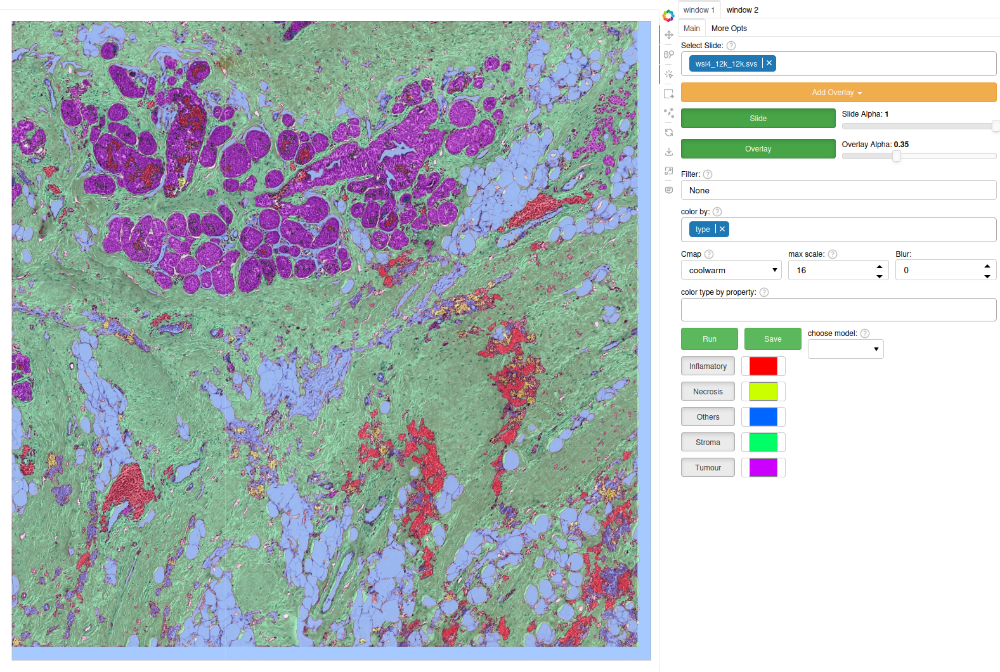



In this notebook, we show how we can use the `SemanticSegmentor` class and its `run` method to predict the semantic segmentation for tiles and WSIs. We show how to use `overlay_prediction_mask` helper function OR `TIAViz` to visualize the results as an overlay on the input image/WSI.



All the processes take place within TIAToolbox and you can easily put the pieces together, following our example code. Just make sure to set inputs and options correctly. We encourage you to further investigate the effect on the prediction output of changing `run` function parameters. Furthermore, if you want to use your own pretrained model for semantic segmentation in the TIAToolbox framework (even if the model structure is not defined in the TIAToolbox model class), you can follow the instructions in our example notebook on [advanced model techniques](https://github.com/TissueImageAnalytics/tiatoolbox/blob/develop/examples/07-advanced-modeling.ipynb) to gain some insights and guidance.

